# **ECSE 415 W2021 - Assignment 2**


In [ ]:
# Mount Google Drive

from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# Import modules

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import math
import sys
!pip install opencv-contrib-python==3.4.2.17

%matplotlib inline

# FOR GRADER: Please direct this path to directory containing the images

path = '/content/drive/MyDrive/ECSE 415/A2-415/images/'

Mounted at /content/drive


# **3. Image Stitching**

## Question 3.1

Compute SIFT keypoints and corresponding descriptors for images 1Montreal and 2Montreal. **(2 points)**


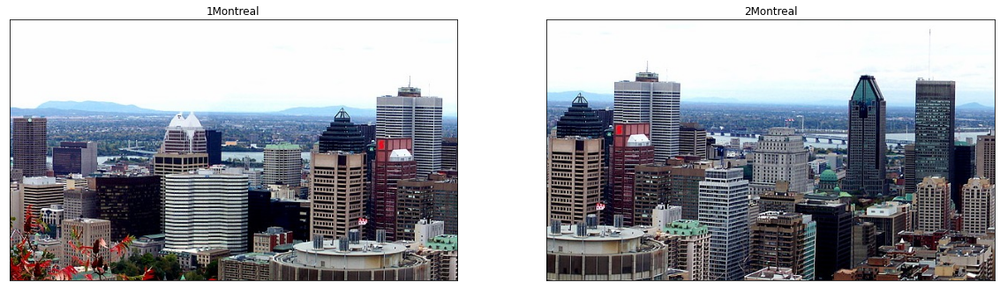

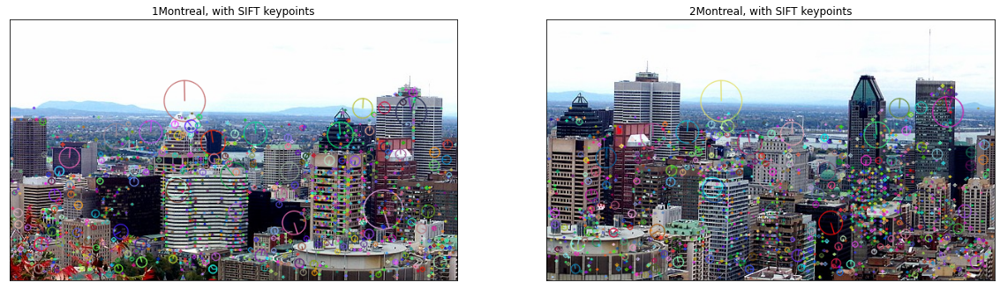

In [ ]:
# load original images
img1 = cv2.imread(path + '1Montreal.jpg')
img2 = cv2.imread(path + '2Montreal.jpg')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,16))
plt.subplot(121), plt.imshow(img1), plt.xticks([]), plt.yticks([])
plt.title("1Montreal")
plt.subplot(122), plt.imshow(img2), plt.xticks([]), plt.yticks([])
plt.title("2Montreal")
plt.show()

# copy images
img1_disp = img1.copy()
img2_disp = img2.copy()

# convert to RGB
img1_disp = cv2.cvtColor(img1_disp, cv2.COLOR_BGR2RGB)
img2_disp = cv2.cvtColor(img2_disp, cv2.COLOR_BGR2RGB)

# create SIFT objects
sift1 = cv2.xfeatures2d.SIFT_create()
sift2 = cv2.xfeatures2d.SIFT_create()

# detect SIFT features on original images, w/o masks
# keypoints1 = sift1.detect(img1, None)   # (image, mask)
# keypoints2 = sift2.detect(img2, None)

# compute SIFT descriptors
# keypoints1, descriptors1 = sift.compute(img1, keypoints1)
# keypoints2, descriptors2 = sift.compute(img2, keypoints2)

# detect and compute SIFT keypoints and descriptors
keypoints1, descriptors1 = sift1.detectAndCompute(img1, None)
keypoints2, descriptors2 = sift2.detectAndCompute(img2, None)


# draw keypoints
# https://docs.opencv.org/master/d4/d5d/group__features2d__draw.html
cv2.drawKeypoints(img1, keypoints1, img1_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(img2, keypoints1, img2_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display SIFT keypoints
plt.figure(figsize=(20,16))
plt.subplot(121), plt.imshow(img1_disp)
plt.title("1Montreal, with SIFT keypoints"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img2_disp)
plt.title("2Montreal, with SIFT keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

## Question 3.2

Find matching keypoints in 1Montreal and 2Montreal images and display the 20 best pairs. **(4 points)**

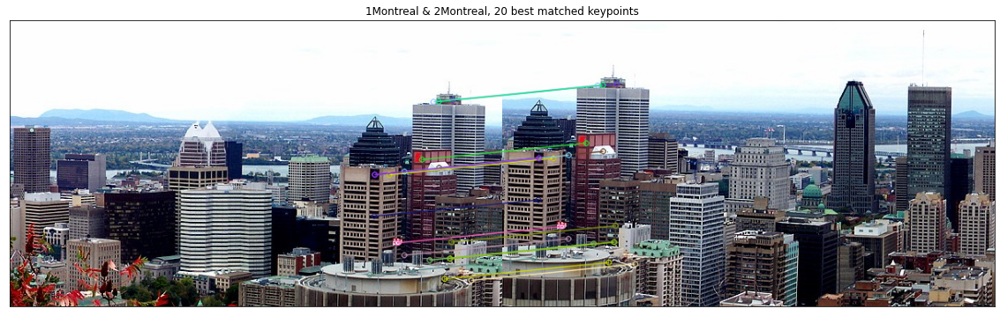

In [ ]:
# get image size
height, width = img1.shape[0:2]

# create BFMatcher, match descriptors, and sort matches
bf = cv2.BFMatcher()
matches = bf.match(descriptors1, descriptors2)
matches = sorted(matches, key = lambda x:x.distance)

# draw first 20 matches
img12_match = cv2.drawMatches(img1, keypoints1, img2, keypoints2, matches[:20], None, flags=2)

# plot images
plt.figure(figsize=(20,16))
plt.imshow(img12_match)
plt.title("1Montreal & 2Montreal, 20 best matched keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

## Question 3.3

3. Find homography using the RANSAC method and apply the transformation to 1Montreal. Image 2Montreal should not be transformed. **(5 points)**

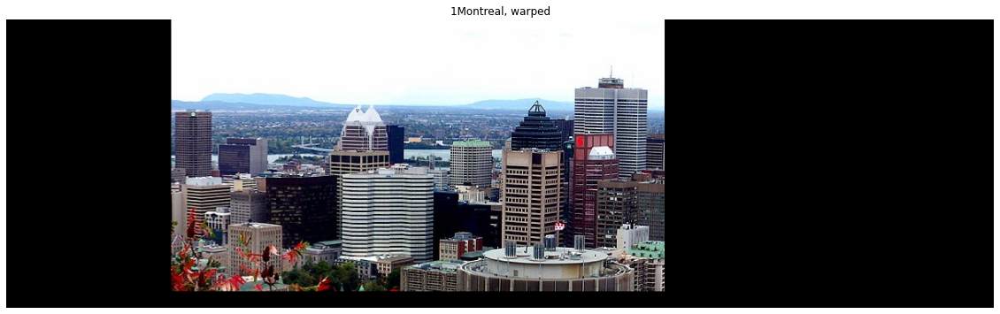

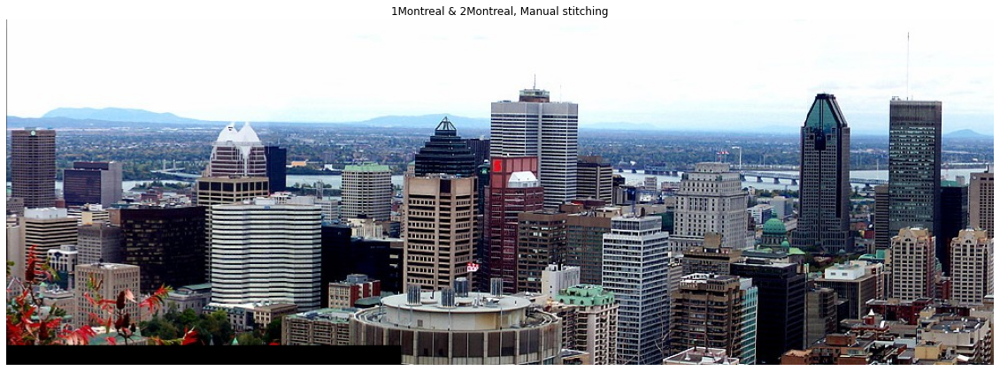

In [ ]:
# use copy of original images
img1M = img1.copy()
img2M = img2.copy()

# match keypoints in 2 lists
GoodMatches = []
for i,m in enumerate(matches):
  if m.distance < 1000:
    GoodMatches.append((m.trainIdx, m.queryIdx))

mpr = np.float32([keypoints2[i].pt for (i, __) in GoodMatches])
mpl = np.float32([keypoints1[i].pt for (__, i) in GoodMatches])

# shift 1Montreal keypoints to border of 2Montreal
for i in range(len(mpr)):
  mpr[i][0] += img2M.shape[1]

# find homography
H, __ = cv2.findHomography(mpl, mpr, cv2.RANSAC, 4)

# warp image, and display
wimg = cv2.warpPerspective(img1M, H, (img2M.shape[1]+img1M.shape[1], img2M.shape[0]))
plt.figure(figsize=(20,16))
plt.imshow(wimg), plt.title('1Montreal, warped'), plt.axis('off')
plt.show()

# create copy, overwrite warped 1Montreal with 2Montreal
img12_manual = wimg.copy()
# img_r = np.zeros( (img2M.shape[0], img2M.shape[1]+img1M.shape[1], 3), dtype=np.uint8 )
# img_r[:img2M.shape[0],img1M.shape[1]:,:] = img2M
img12_manual[:,img2M.shape[1]:,:] = img2M
img12_manual = img12_manual[:img12_manual.shape[0], 200:img12_manual.shape[1]]

# plot image
plt.figure(figsize=(20,16))
plt.imshow(img12_manual), plt.title("1Montreal & 2Montreal, Manual stitching"), plt.axis('off')
plt.show()

## Question 3.4

Stitch transformed 1Montreal and the original 2Montreal together using
linear image blending. Let us call this image 12Montreal. Display this image. **(4 points)**

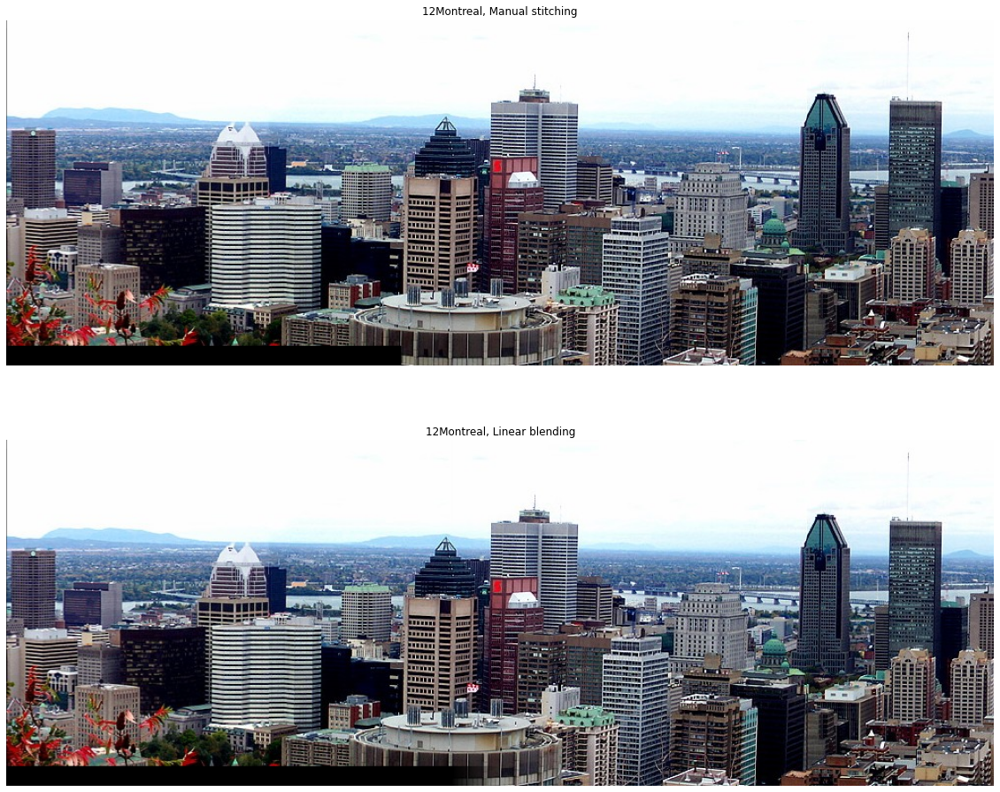

In [ ]:
# Linear Image Blending function
def linear_blend(image_width, ramp_width, ramp_index=50, start=0, end=1):
    alpha = np.zeros(image_width).astype(np.float)  
    step = (end - start) / (ramp_width - 1)
    index = ramp_index - ramp_width
    for i in range(ramp_width):
        alpha[index] = start + step * i
        index += 1
    alpha[index:] = 1
    return alpha

# Stitch warped 1Montreal and 2Montreal with linear blending
img_A = wimg.copy()
img_B = np.zeros((img2M.shape[0], img1M.shape[1]+img2M.shape[1], 3)).astype(np.uint8)
img_B[:, img2M.shape[1]:, :] = img2M

# Crop 
crop_A = img_A[:img_A.shape[0], 200:img_A.shape[1]]
crop_B = img_B[:img_B.shape[0], 200:img_B.shape[1]]

# plt.figure(figsize=(20,16)), plt.imshow(crop_A), plt.show()
# plt.figure(figsize=(20,16)), plt.imshow(img_B), plt.show()

a = linear_blend(crop_B.shape[1], 50, round(crop_B.shape[1]/2), 0, 1)

# Blend warped 1Montreal and 2Montreal
img12 = (a.reshape(1,-1,1)) * crop_B + (1-a.reshape(1,-1,1)) * crop_A
img12 = np.uint8(img12)

plt.figure(figsize=(20,16))
plt.subplot(211), plt.imshow(img12_manual)
plt.title('12Montreal, Manual stitching'), plt.axis('off')
plt.subplot(212), plt.imshow(img12)
plt.title('12Montreal, Linear blending'), plt.axis('off')
plt.show()

## Question 3.5

5. Compute SIFT keypoints and corresponding descriptors for images 12Montreal and 3Montreal. (2 points)

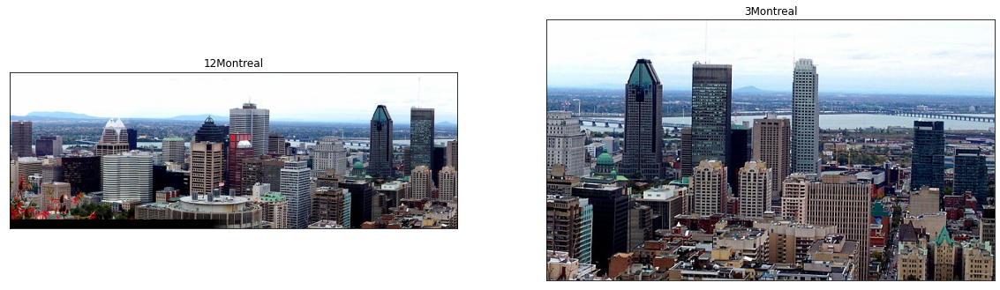

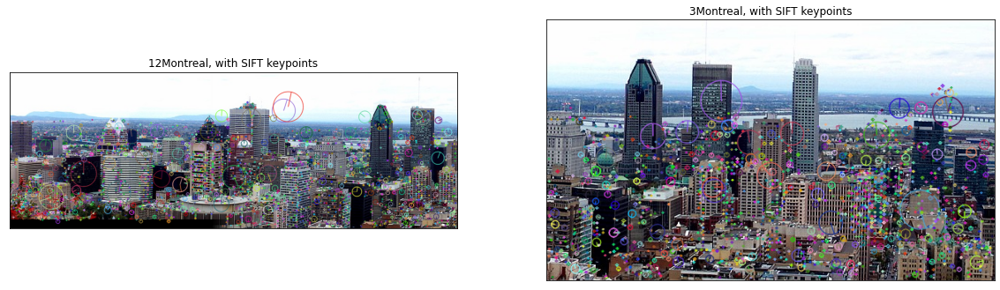

In [ ]:
# load 3Montreal.jpg
img3M = cv2.imread(path + '3Montreal.jpg')
img3M = cv2.cvtColor(img3M, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,16))
plt.subplot(121), plt.imshow(img12), plt.xticks([]), plt.yticks([])
plt.title("12Montreal")
plt.subplot(122), plt.imshow(img3M), plt.xticks([]), plt.yticks([])
plt.title("3Montreal")
plt.show()

# copy images
img12_disp = img12.copy()
img3M_disp = img3M.copy()

# convert to RGB
img12_disp = cv2.cvtColor(img12_disp, cv2.COLOR_BGR2RGB)
img3M_disp = cv2.cvtColor(img3M_disp, cv2.COLOR_BGR2RGB)

# create SIFT objects
sift3 = cv2.xfeatures2d.SIFT_create()
sift4 = cv2.xfeatures2d.SIFT_create()

# detect and compute SIFT keypoints and descriptors
keypoints12, descriptors12 = sift3.detectAndCompute(img12, None)
keypoints3, descriptors3 = sift4.detectAndCompute(img3M, None)


# draw keypoints
# https://docs.opencv.org/master/d4/d5d/group__features2d__draw.html
cv2.drawKeypoints(img12, keypoints12, img12_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(img3M, keypoints1, img3M_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display SIFT keypoints
plt.figure(figsize=(20,16))
plt.subplot(121), plt.imshow(img12_disp)
plt.title("12Montreal, with SIFT keypoints"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img3M_disp)
plt.title("3Montreal, with SIFT keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

## Question 3.6

Find matching keypoints in 12Montreal and 3Montreal images and display the 20 best pairs. (4 points)

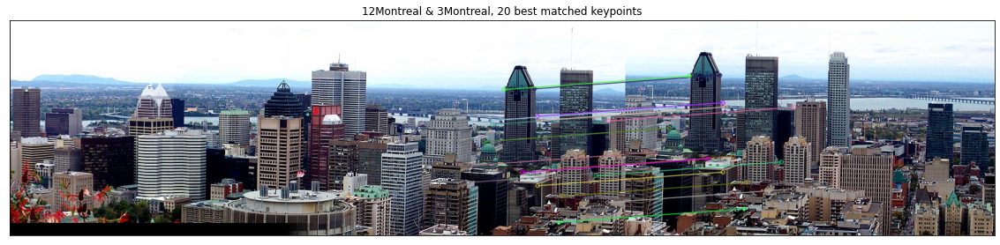

In [ ]:
# get image size
h12, w12 = img12.shape[0:2]

# create BFMatcher, match descriptors, and sort matches
bf123 = cv2.BFMatcher()
matches123 = bf123.match(descriptors12, descriptors3)
matches123 = sorted(matches123, key = lambda x:x.distance)

# draw first 20 matches
img123_matches = cv2.drawMatches(img12, keypoints12, img3M, keypoints3, matches123[:20], None, flags=2)

# plot images
plt.figure(figsize=(20,16))
plt.imshow(img123_matches)
plt.title("12Montreal & 3Montreal, 20 best matched keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

## Question 3.7

Compute the homography using the RANSAC method. Apply the transformation to 3Montreal. Image 12Montreal should not be transformed. **(5 points)**

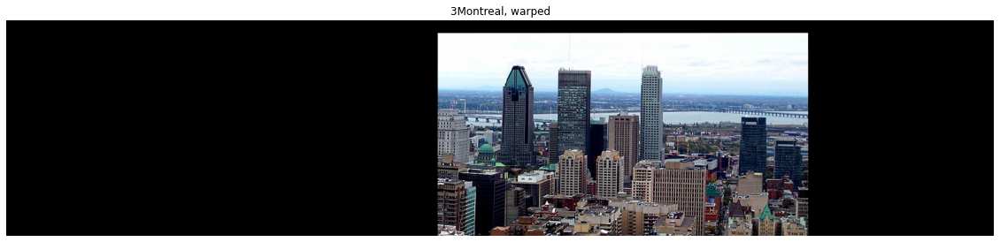

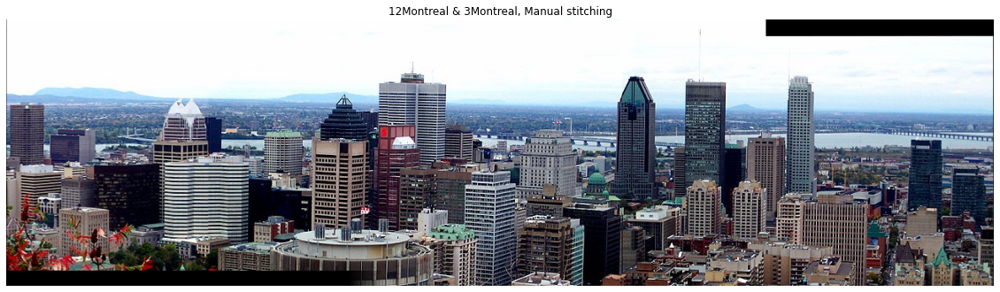

In [ ]:
# img12, img3M

# match keypoints in 2 lists
GoodMatches123 = []
for i,m in enumerate(matches123):
  if m.distance < 1000:
    GoodMatches123.append((m.trainIdx, m.queryIdx))

mpr123 = np.float32([keypoints3[i].pt for (i, __) in GoodMatches123])
mpl123 = np.float32([keypoints12[i].pt for (__, i) in GoodMatches123])

# find homography
H123, __ = cv2.findHomography(mpr123, mpl123, cv2.RANSAC, 4)

# warp image, and display
wimg3 = cv2.warpPerspective(img3M, H123, (img3M.shape[1]+img12.shape[1], img12.shape[0]))
plt.figure(figsize=(20,16))
plt.imshow(wimg3), plt.title('3Montreal, warped'), plt.axis('off')
plt.show()

# # create copy, overwrite warped 1Montreal with 2Montreal
img123_manual = wimg3.copy()
# # img_r = np.zeros( (img2M.shape[0], img2M.shape[1]+img1M.shape[1], 3), dtype=np.uint8 )
# # img_r[:img2M.shape[0],img1M.shape[1]:,:] = img2M
img123_manual[:,:img12.shape[1],:] = img12
img123_manual = img123_manual[:, :1300]

# # plot image
plt.figure(figsize=(20,16))
plt.imshow(img123_manual), plt.title("12Montreal & 3Montreal, Manual stitching"), plt.axis('off')
plt.show()

## Question 3.8

Stitch transformed 3Montreal and 12Montreal together using linear image blending. Display the resulting image. **(4 points)**

(350, 1300, 3)
(350, 1300, 3)


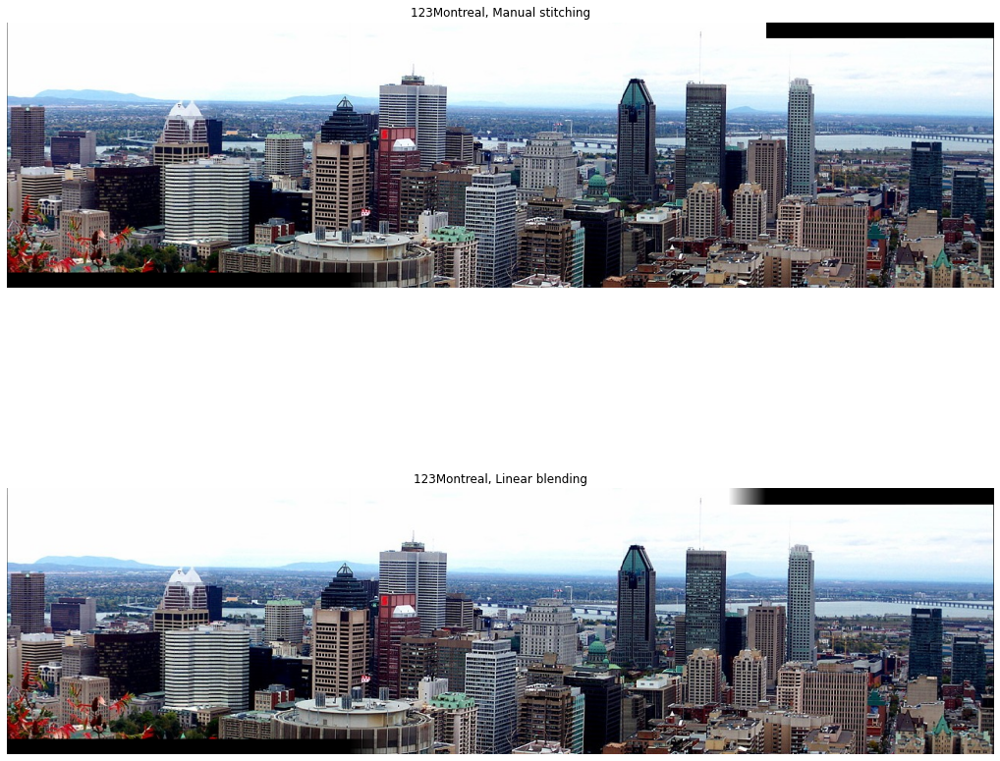

In [ ]:
# Stitch 12Montreal and warped 3Montreal with linear blending
img_X = np.zeros((img12.shape[0], img12.shape[1]+img3M.shape[1], 3)).astype(np.uint8)
img_X[:, :img12.shape[1], :] = img12
img_Y = wimg3

# Crop 
crop_X = img_X[:, :1300]
print(crop_X.shape)
crop_Y = img_Y[:, :1300]
print(crop_Y.shape)

# plt.figure(figsize=(20,16)), plt.imshow(crop_X), plt.show()
# plt.figure(figsize=(20,16)), plt.imshow(crop_Y), plt.show()

# Apply linear blending
a123 = linear_blend(crop_X.shape[1], 50, img12.shape[1], 0, 1)

# Blend 12Montreal and warped 3Montreal
img123_blend = (1-a123.reshape(1,-1,1)) * crop_X + (a123.reshape(1,-1,1)) * crop_Y
img123_blend = np.uint8(img123_blend)

plt.figure(figsize=(18,16))
plt.subplot(211), plt.imshow(img123_manual), plt.title('123Montreal, Manual stitching'), plt.axis('off')
plt.subplot(212), plt.imshow(img123_blend), plt.title('123Montreal, Linear blending'), plt.axis('off')
plt.show()

# 4. Template Matching

## Question 4.1

Given a reference image (scene of Montreal Snow Festival) and a template face image, iterate over all pixel locations of the reference image and compare the local patch with the template image using the sum of square distance (SSD) metric. Implement this in NumPy (you are prohibited from using OpenCV function for this). **(6 points)**

In [ ]:
#Ref : https://gist.github.com/nimpy/54ccb199c978a5074cdcd35fc696a904

def ssd(i, j, window_h, window_w, img1, img2):

    return np.sum((img1- img2[i: i+ window_w, j: j+ window_h])**2)

In [ ]:

def template_matching(festival, face) : 
  #size of the window needs to be the size of the face template 

  window_h = face.shape[0]
  window_w = face.shape[1]


  window =  np.full_like(face, 0)
  #size of the image
  festival_h = festival.shape[0]
  festival_w = festival.shape[1]
  #iterate through the entire festival image 
  location = (-1, -1)

  #Getting a number that's smaller than all others
  min_dist = float('inf')
  ssd_array=[]

  for i in range(0, festival_w-window_w): 
    for j in range(0, festival_h-window_h): 

      value = ssd(j, i, window_h, window_w, face, festival)

      if(value<min_dist): 
        min_dist=value
        location = (i,j)


      ssd_array.append(value)   

  #turning the 1d array of ssds into an array of the shape of the returned image and flipping it
  ssd_array = np.rot90(np.reshape(ssd_array, ( festival_w-window_w, festival_h-window_h)))

  return ssd_array , location


## Question 4.2

Display SSD for the whole image. Find the location ((x, y) coordinate) where the SSD is minimum and see if you can find the person there! **(4 points)**

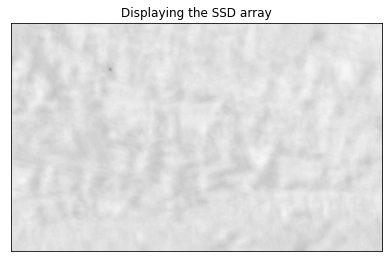

Location of the template
(251, 459)


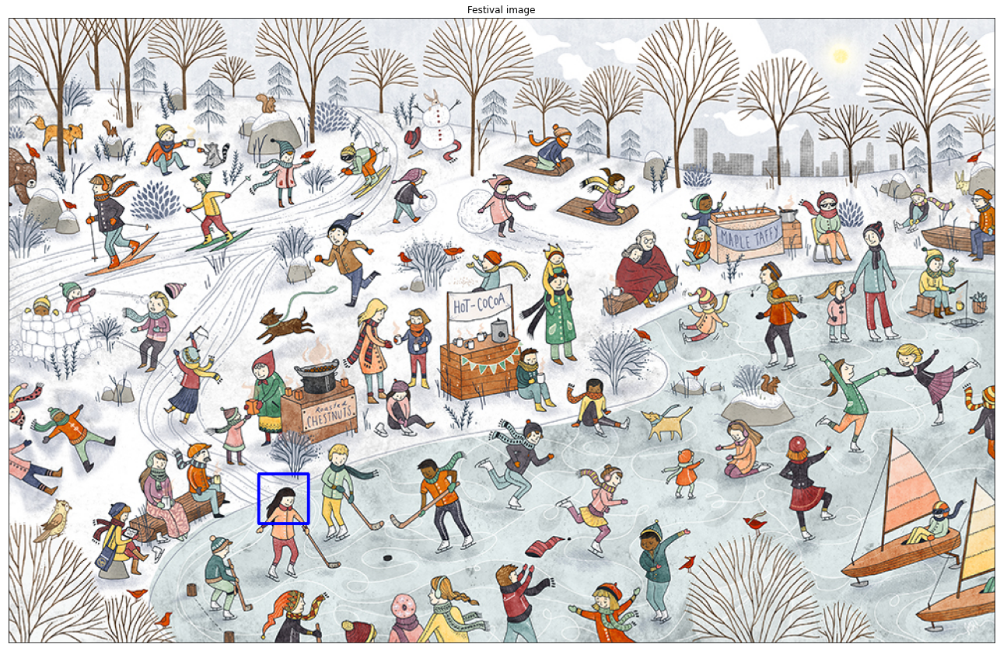

In [ ]:
#Displaying the SSD
festival = mpimg.imread(path+'find_me_image.jpg')

face = mpimg.imread(path + 'template.jpg')

ssd_array , location = template_matching(festival, face)

plt.figure(figsize=(16, 20), constrained_layout=True)
plt.subplot(131), plt.imshow(ssd_array, cmap='gray')
plt.title("Displaying the SSD array"), plt.xticks([]), plt.yticks([])
plt.show()


#Printing the location of the template in the image
print("Location of the template")
print(location)

top_corner = location

bottom_corner = (location[0] + face.shape[0], location[1] + face.shape[1] )

cv2.rectangle(festival, top_corner, bottom_corner, (0, 0, 255), 2)


plt.figure(figsize=(50,50))
plt.subplot(122), plt.imshow(festival)
plt.title("Festival image"), plt.xticks([]),plt.yticks([])
plt.show()

## Question 4.3

Repeat the above process with the noisy template as shown in Figure:4(c). **(4 points)**

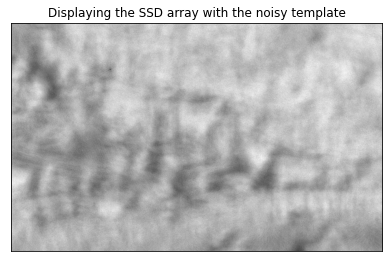

Location of the noisy template
(251, 459)


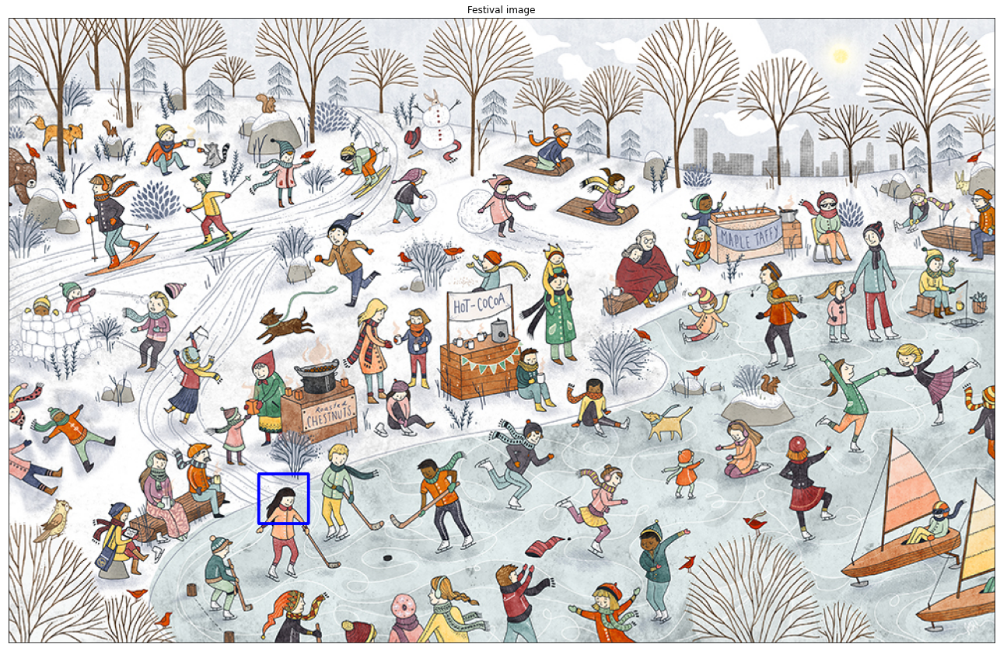

In [ ]:
#Displaying the SSD
festival_for_noise = mpimg.imread(path+'find_me_image.jpg')

face_noisy = mpimg.imread(path + 'template_noisy.jpg')

ssd_array_noise , location_noise = template_matching(festival_for_noise, face_noisy)

plt.figure(figsize=(16, 20), constrained_layout=True)
plt.subplot(131), plt.imshow(ssd_array_noise, cmap='gray')
plt.title("Displaying the SSD array with the noisy template"), plt.xticks([]), plt.yticks([])
plt.show()


#Printing the location of the template in the image
print("Location of the noisy template")
print(location_noise)

top_corner2 = location_noise

bottom_corner2 = (location_noise[0] + face_noisy.shape[0], location_noise[1] + face_noisy.shape[1] )

cv2.rectangle(festival_for_noise, top_corner2, bottom_corner2, (0, 0, 255), 2)


plt.figure(figsize=(50,50))
plt.subplot(122), plt.imshow(festival_for_noise)
plt.title("Festival image"), plt.xticks([]),plt.yticks([])
plt.show()